# Рынок заведений общественного питания Москвы

## Основные положения

### Описание проекта

Инвестор просят подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего места для нового заведения питания.  
Для выполнения работы доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

### Цель работы

Цель работы - подготовить презентацию, которая поможет в выборе подходящего места для открытия заведение общественного питания в Москве.

### План выполнения работ

План работ:
1. Загрузить данные и оценить состав исходной информации.
2. Провести предобработку данных.
3. Проанализировать весь состав исходных данных.
4. Детализация анализа в отношении кофеен.
5. Подготовка презентации.

## Выполнение работы

In [1]:
import pandas as pd
import re
from IPython.display import display, HTML
import matplotlib.pyplot as plt
from matplotlib.axes import Axes
import numpy as np
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import json
from folium import Map, Choropleth
from folium import Marker, Map
from folium.plugins import MarkerCluster

### Получение данных

In [4]:
data = pd.read_csv('/datasets/moscow_places.csv')
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


In [5]:
#Исключаем дублирование из-за написания названий в разных регистрах
print('В исходных данных представлено {} заведений.'.format(data['name'].str.lower().nunique())) 

В исходных данных представлено 5512 заведений.


In [6]:
print('Типы данных')
data.info()

Типы данных
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Всего 8406 записи. Типы данных: float64(6), int64(1), object(7).

### Предобработка данных

#### Поиск дубликатов

In [7]:
print('Число полных строк - точных дубликатов: {}'.format( data.duplicated().sum()))

Число полных строк - точных дубликатов: 0


Приведем значения всех текстовых столбцов к нижнему регистру, чтобы проверить на дубликаты без учета регистра в написании слов. 

In [8]:
data_l = data.copy()
object_columns = data_l.select_dtypes('object').columns.tolist() #Учитываем только тип object
for column in object_columns:
    data_l[column] = data_l[column].str.lower()
display(data_l.head())
print('Число полных строк - дубликатов c приведением к нижнему регистру: {}'.format( data_l.duplicated().sum()))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0


Число полных строк - дубликатов c приведением к нижнему регистру: 0


Проверим, есть ли дубликаты заведений с различающимися харктеристиками.

In [9]:
print('Число строк - дубликатов по столбцам name и address c приведением к нижнему регистру: {}'
      .format( data_l.duplicated(['name', 'address'])
      .sum()))

Число строк - дубликатов по столбцам name и address c приведением к нижнему регистру: 4


Проверим визуально, насколько эти записи реально являются дубликатами. Отобразим основные и дублиующиеся значения.

In [10]:
data_l[data_l.duplicated(['name', 'address'], keep = False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",северо-восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",северо-восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Хотя у некоторых дубликатов категории и координаты не совпадают, одинаковые рейтинги и количество посадочных мест говорят о том, что это все-таки дубликаты.  
Название "Кафе", вероятно, записано из-за отсутствия точных сведений о реальном названии.
По остальным строкам, очевидно, есть дублирование, но надо понять, какие данные следует оставить, так как они в некоторых колонках заполнены по-разному. Например, во времени работы и признаке принадлежности сети. 

Проверим все записи с названиями из списка дублирующихся заведений.

In [11]:
dupl_names = data_l[data_l.duplicated(['name', 'address'], keep = False)]['name'].unique()
list(dupl_names)

['кафе', 'more poke', 'раковарня клешни и хвосты', 'хлеб да выпечка']

Исключим название "кафе".

In [12]:
data_l[data_l['name'].isin(['more poke', 'раковарня клешни и хвосты', 'хлеб да выпечка'])].sort_values(by='name')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
6088,more poke,ресторан,"москва, духовской переулок, 19",южный административный округ,"ежедневно, 10:00–22:00",55.704177,37.612889,4.4,NaN,NaN,NaN,NaN,1,NaN
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",северо-восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",северо-восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
7270,раковарня клешни и хвосты,"бар,паб","москва, братиславская улица, 12",юго-восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.659744,37.752984,4.9,средние,цена бокала пива:150–250 ₽,NaN,NaN,1,40.0
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0
7937,хлеб да выпечка,кофейня,"москва, каширское шоссе, 61г",южный административный округ,"ежедневно, 09:00–22:00",55.621379,37.714108,4.5,NaN,NaN,NaN,NaN,1,NaN


По всем дубликатам нашлись еще по одному заведению с другим адресом. Имеет смысл из дубликатов оставить только те, которые имеют признаки сетевых. Альтернативные удаляем.

In [13]:
to_del = list([1430, 2211, 3109])

In [14]:
#Удаляем в датасете со строчными буквами в текстовых значениях
print('Исходное количество записей:', len(data_l))
data_l = data_l.drop(index=to_del)
print('Итоговое количество записей:', len(data_l))

Исходное количество записей: 8406
Итоговое количество записей: 8403


In [15]:
#Удаляем дубликаты в исходном датасете
print('Исходное количество записей:', len(data))
data = data.drop(index=to_del)
print('Итоговое количество записей:', len(data))

Исходное количество записей: 8406
Итоговое количество записей: 8403


#### Поиск пропусков

Проверим, сколько пустых значений NaN  в каждой колонке.

In [16]:
data_l.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5088
avg_bill             4587
middle_avg_bill      5254
middle_coffee_cup    7868
chain                   0
seats                3611
dtype: int64

Заполним пустые ячейки в колонке hours значением 'нет данных'.

In [17]:
data['hours'] = data['hours'].fillna('нет данных')
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                   0
lat                     0
lng                     0
rating                  0
price                5088
avg_bill             4587
middle_avg_bill      5254
middle_coffee_cup    7868
chain                   0
seats                3611
dtype: int64

Что делать с попущенными значениями будет понятно из того, для каких выводов потребуются эти данные.

#### Отдельный столбец с названием улицы

In [18]:
pattern = ',[0-9А-Яа-яЁё -]*' #Для поиска фрагмента текста после первой запятой до следующей, если она есть
data['street'] = data['address'].map(
    lambda x:  re.search(pattern, x).group().strip(', ') )#у выделенного образца удаляем ненужные символы
display(data[['address', 'street']].head())

,address,street
0,"Москва, улица Дыбенко, 7/1",улица Дыбенко
1,"Москва, улица Дыбенко, 36, корп. 1",улица Дыбенко
2,"Москва, Клязьминская улица, 15",Клязьминская улица
3,"Москва, улица Маршала Федоренко, 12",улица Маршала Федоренко
4,"Москва, Правобережная улица, 1Б",Правобережная улица


Проверим, где улица не обработалась, по длине строки значения в новом столбце улицы.

In [19]:
data['st_name_len'] =data['street'].map(lambda x: len(x)) #добавляем столбец с длиной строки названия улицы
#проверяем отсутствие заполнения названия улицы
display(data.query('st_name_len < 1')[['address', 'street', 'st_name_len']].sort_values(by=['st_name_len','street']))
data.drop('st_name_len', axis= 1 , inplace= True ) #удаляем столбец с длиной строки названия улицы

,address,street,st_name_len
6309,"Москва, № 7",,0


Очевидна ошибка в заполнении адреса. Данный адрес можно не учитывать.

#### Признак круглосуточной работы

Создаем новый столбец is_24_7 с логическим признаком круглосуточной работы.

In [20]:
data['is_24_7'] = data['hours'].map(lambda x: True if 'ежедневно, круглосуточно' in x else False)
display(data[['hours','is_24_7']])
print(data['is_24_7'].value_counts());

,hours,is_24_7
0,"ежедневно, 10:00–22:00",False
1,"ежедневно, 10:00–22:00",False
2,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",False
3,"ежедневно, 09:00–22:00",False
4,"ежедневно, 10:00–22:00",False
...,...,...
8401,"ежедневно, 09:00–02:00",False
8402,"ежедневно, 08:00–22:00",False
8403,"ежедневно, круглосуточно",True
8404,"ежедневно, круглосуточно",True


False    7673
True      730
Name: is_24_7, dtype: int64


Всего 730 заведений работают ежедневно и круглосуточно.

Проверяем датасет:

In [21]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


### Анализ данных

#### Категории заведений

In [22]:
cats = pd.DataFrame(data.category.value_counts()).reset_index()
cats.columns = ['categories','amount']
cats

,categories,amount
0,кафе,2377
1,ресторан,2041
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


In [23]:
print('В данных присутствуют следующие типы заведений: {}'.format(cats['categories'].unique()))

В данных присутствуют следующие типы заведений: ['кафе' 'ресторан' 'кофейня' 'бар,паб' 'пиццерия' 'быстрое питание'
 'столовая' 'булочная']


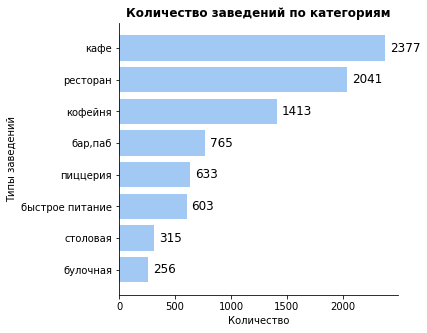

In [24]:
sns.set_palette("pastel")
f, ax = plt.subplots(figsize=(5, 5))
hbars = ax.barh(cats['categories'], cats['amount'], label = cats['amount'], align='center')
ax.invert_yaxis()
ax.bar_label(hbars, padding=5,  
             fontsize=12, label_type='edge' 
            )
ax.spines[['right', 'top']].set_visible(False)
ax.set_xlabel('Количество')
ax.set_ylabel('Типы заведений')
ax.set_title('Количество заведений по категориям', fontweight = 'bold')
plt.show();

Наибольшее количество заведений присутствует в категории "кафе" - 2377, наименьшее - в категории "булочная" - 256. 

#### Количество посадочных мест

In [25]:
data_to_plot = data.copy()

#Заменим признак сети на смысловой текст для вывода на графики
data_to_plot['chain'] = data_to_plot['chain'].map(lambda x: 'Сеть' if x else 'Не сеть')

Оценим все данные и величины их выбросов.

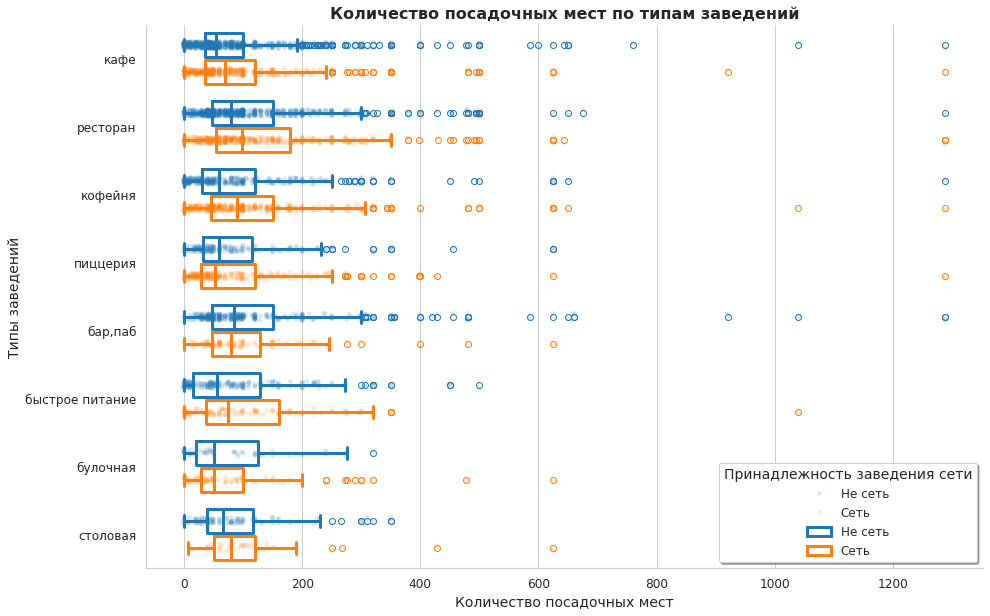

In [26]:
sns.set_theme(style="whitegrid", font_scale= 1.1)
fig, ax = plt.subplots(figsize=(15, 10))

vplot = sns.stripplot(x='seats', y='category',
               data=data_to_plot,  ax = ax,   dodge=True, hue = 'chain', palette='tab10', size=5, marker="o", alpha=.15)

sns.boxplot(x='seats', y='category',
               data=data_to_plot, palette='tab10', ax = ax,  hue = 'chain', fill = False, gap=.1, linewidth=3)

ax.set_xlabel("Количество посадочных мест", fontsize=14)
vplot.legend(title = "Принадлежность заведения сети", title_fontsize = 14, fontsize = 12, shadow = True, facecolor = 'white')
ax.set_ylabel("Типы заведений", fontsize=14)
ax.set_title("Количество посадочных мест по типам заведений", fontsize=16, fontweight = 'bold')
sns.despine(top=True)
plt.show()

Ограничим видимую область для лучего масштаба, построим два графика с сортировкой медианных средних числа посадочных мест сначала сетевых заведений, затем - несетевых.

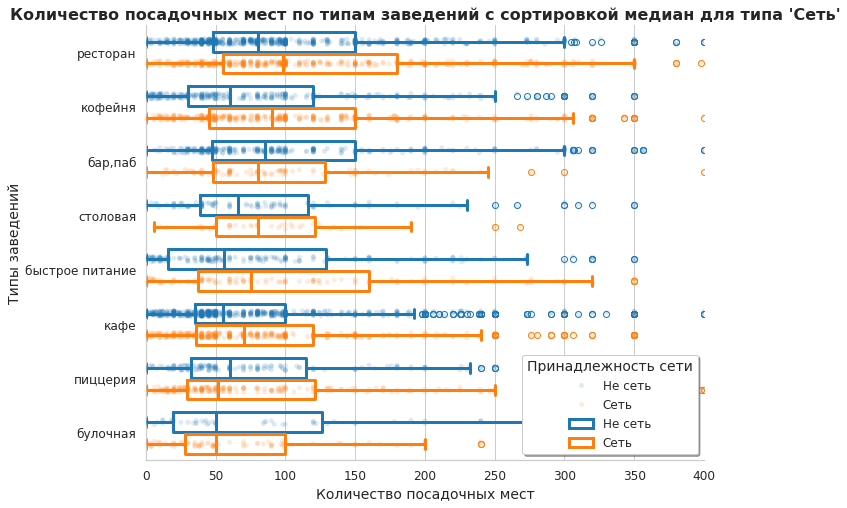

Типы заведений по убыванию медианных значений посадочных мест: ['ресторан', 'кофейня', 'бар,паб', 'столовая', 'быстрое питание', 'кафе', 'пиццерия', 'булочная']


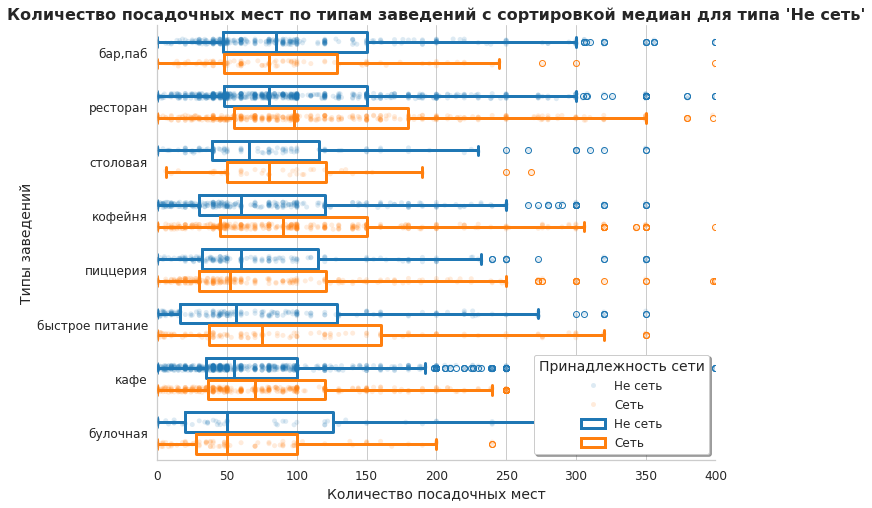

Типы заведений по убыванию медианных значений посадочных мест: ['бар,паб', 'ресторан', 'столовая', 'кофейня', 'пиццерия', 'быстрое питание', 'кафе', 'булочная']


In [27]:
for chain_type in ['Сеть', 'Не сеть']:
    index_sorted = data_to_plot.query('chain == @chain_type').groupby('category')['seats'].median().sort_values(ascending = False).index
    index_sorted

    sns.set_theme(style="whitegrid", font_scale= 1.1)
    fig, ax = plt.subplots(figsize=(10, 8))

    ax.set_xlim(0, 400)

    vplot = sns.stripplot(x='seats', y='category',
                   data=data_to_plot,  ax = ax,   dodge=True, hue = 'chain',
                          palette='tab10', size=5, marker="o", alpha=.15, order = index_sorted)

    sns.boxplot(x='seats', y='category',
                   data=data_to_plot, palette='tab10', ax = ax,  hue = 'chain',
                fill = False, gap=.1, linewidth=3, order = index_sorted)

    ax.set_xlabel("Количество посадочных мест", fontsize=14)
    vplot.legend(title = "Принадлежность сети", title_fontsize = 14, fontsize = 12, shadow = True, facecolor = 'white')
    ax.set_ylabel("Типы заведений", fontsize=14)
    ax.set_title("Количество посадочных мест по типам заведений c сортировкой медиан для типа '"+ chain_type+"'",
                 fontsize=16, fontweight = 'bold')
    sns.despine(top=True, right=True)
    plt.show()
    print('Типы заведений по убыванию медианных значений посадочных мест:', list(index_sorted))

Если учитывать сетевые заведения, то по убыванию медианных значений количества посадочным мест порядок будет такой: 'ресторан', 'кофейня', 'бар,паб', 'столовая', 'быстрое питание', 'кафе', 'пиццерия', 'булочная'.
Для несетевых заведений - 'бар,паб', 'ресторан', 'столовая', 'кофейня', 'пиццерия', 'быстрое питание', 'кафе', 'булочная'.

#### Соотношение сетевых и несетевых заведений 

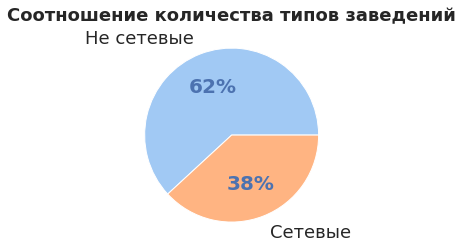

In [28]:
sns.set_palette("pastel")
patches, texts, autotexts = plt.pie(data.chain.value_counts(normalize=True)*100,
       labels = ['Не сетевые', 'Сетевые'], labeldistance=1.2,
       autopct='%.0f%%', textprops={'fontsize': 18})
plt.title("Соотношение количества типов заведений", fontsize = 18, fontweight = 'bold')

for autotext in autotexts:
    autotext.set_color('b')
    autotext.set_fontsize(20)
    autotext.set_fontweight('bold')

plt.show()

Не сетевых заведений больше - их 62% от общего числа, а сетевых - 38%.

#### Категории сетевых заведений

In [29]:
chain_percent=data_to_plot.groupby('category')['chain'].value_counts(normalize=True).reset_index(name='percent')
chain_percent['percent'] = chain_percent['percent'] *100
chain_percent

,category,chain,percent
0,"бар,паб",Не сеть,77.908497
1,"бар,паб",Сеть,22.091503
2,булочная,Сеть,61.328125
3,булочная,Не сеть,38.671875
4,быстрое питание,Не сеть,61.525705
5,быстрое питание,Сеть,38.474295
6,кафе,Не сеть,67.227598
7,кафе,Сеть,32.772402
8,кофейня,Сеть,50.955414
9,кофейня,Не сеть,49.044586


In [30]:
cat_sorted1 = list(chain_percent.query('chain == "Сеть"').sort_values(by='percent',ascending=False)['category'])
print('Категории по убыванию доли сетевых заведений:', cat_sorted1)

Категории по убыванию доли сетевых заведений: ['булочная', 'пиццерия', 'кофейня', 'быстрое питание', 'ресторан', 'кафе', 'столовая', 'бар,паб']


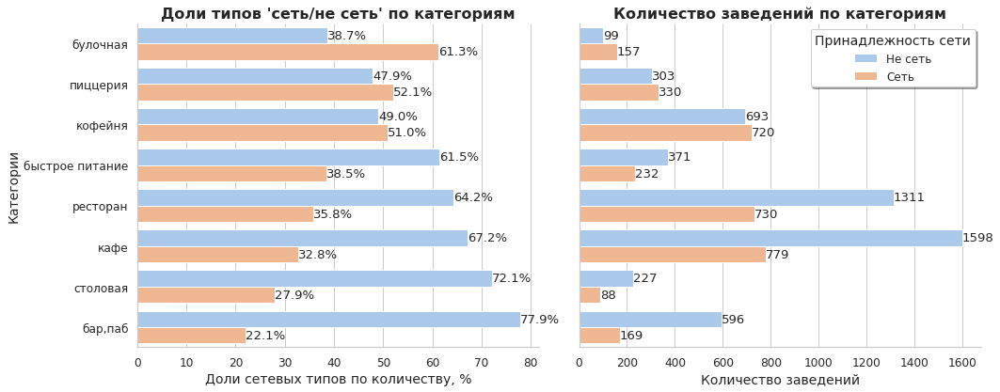

In [31]:
fig, axs = plt.subplots(ncols=2, figsize=(15, 6),  sharey=True) #Два графика на одной оси
sns.set_palette('pastel')

#Диаграмма с долями в процентах
sns.barplot(y='category', x='percent', hue='chain', data=chain_percent, 
            orient='h', ax=axs[0], palette='pastel', legend=False,
            order = cat_sorted1) #Сортируем по предыдущему списку)
for container in axs[0].containers:
    axs[0].bar_label(container, fmt='%.1f%%')

axs[0].set_xlabel("Доли сетевых типов по количеству, %", fontsize=14)
axs[0].set_ylabel("Категории", fontsize=14)
axs[0].set_title("Доли типов 'сеть/не сеть' по категориям",
                 fontsize=16, fontweight = 'bold')

#Диаграмма с абсолютными значениями
g2 = sns.countplot(y='category', hue='chain', data=data_to_plot, ax=axs[1]) 

for container in axs[1].containers:
    axs[1].bar_label(container)

axs[1].set_xlabel("Количество заведений", fontsize=14)
axs[1].set_title("Количество заведений по категориям",
                 fontsize=16, fontweight = 'bold')
    
g2.legend(title = "Принадлежность сети", title_fontsize = 14, fontsize = 12, shadow = True, facecolor = 'white')
    
sns.despine(top=True, right=True)    

fig.tight_layout()    

По доле сетевых заведений лидирует категория "Булочные", затем идут "Пиццерия" и "Кофейня".

#### Популярные сети

Выберем 15 сетей с наибольшим количеством точек.

In [32]:
pop_chains = data.query('chain == 1').groupby(['name','category'])['address'].agg('count')\
    .sort_values(ascending=False).reset_index(name='count').head(15)
display(pop_chains)
print('Топ15 сетей:', pop_chains.name.to_list())

,name,category,count
0,Шоколадница,кофейня,119
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,71
4,Яндекс Лавка,ресторан,69
5,Cofix,кофейня,65
6,Prime,ресторан,49
7,КОФЕПОРТ,кофейня,42
8,Кулинарная лавка братьев Караваевых,кафе,39
9,Теремок,ресторан,36


Топ15 сетей: ['Шоколадница', "Домино'с Пицца", 'Додо Пицца', 'One Price Coffee', 'Яндекс Лавка', 'Cofix', 'Prime', 'КОФЕПОРТ', 'Кулинарная лавка братьев Караваевых', 'Теремок', 'CofeFest', 'Чайхана', 'Буханка', 'Drive Café', 'Кофемания']


Проверим, к каким категориям относятся ТОП15 сетей.

In [33]:
print ('Категории по убыванию частотности для наиболее распространенных сетей:', pop_chains.groupby('category').name.agg('count').sort_values(ascending=False))

Категории по убыванию частотности для наиболее распространенных сетей: category
кофейня     6
кафе        3
ресторан    3
пиццерия    2
булочная    1
Name: name, dtype: int64


Объединим название сети с ее категорией для удобства визуализации.

In [34]:
pop_chains.name = pop_chains.name + ' (' + pop_chains.category + ')'
pop_chains.drop('category', axis= 1 , inplace= True )
pop_chains

,name,count
0,Шоколадница (кофейня),119
1,Домино'с Пицца (пиццерия),76
2,Додо Пицца (пиццерия),74
3,One Price Coffee (кофейня),71
4,Яндекс Лавка (ресторан),69
5,Cofix (кофейня),65
6,Prime (ресторан),49
7,КОФЕПОРТ (кофейня),42
8,Кулинарная лавка братьев Караваевых (кафе),39
9,Теремок (ресторан),36


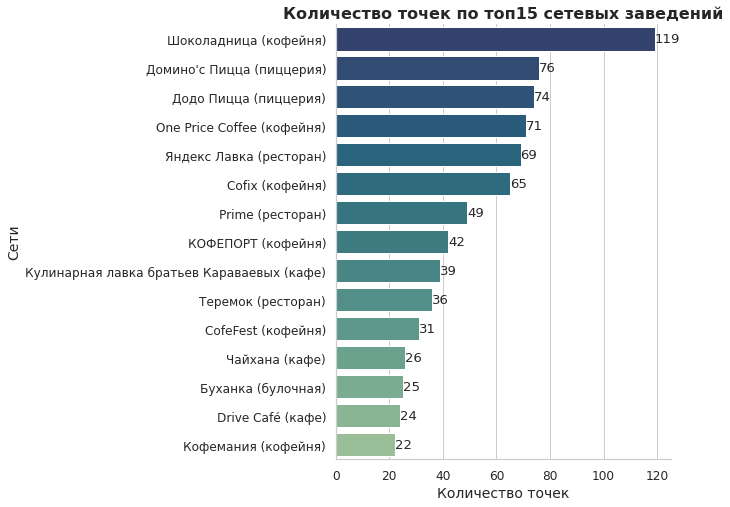

In [35]:
fig, ax = plt.subplots(figsize=(6, 8))
sns.barplot(y='name', x='count', data=pop_chains, 
            orient='h', palette='crest_r', hue='name', legend=False)
for container in ax.containers:
    ax.bar_label(container)
    
ax.set_xlabel("Количество точек", fontsize=14)
ax.set_ylabel("Сети", fontsize=14)
ax.set_title("Количество точек по топ15 сетевых заведений",
                 fontsize=16, fontweight = 'bold')
sns.despine(top=True, right=True)
fig.show()

#### Заведения по районам Москвы

In [36]:
df2 = data.groupby(['district', 'category'])['name'].agg('count').reset_index()
df2['district'] = df2['district'].str.replace('административный округ','АО') #Сокращаем текст для удобства визуализации
df2

,district,category,name
0,Восточный АО,"бар,паб",53
1,Восточный АО,булочная,25
2,Восточный АО,быстрое питание,71
3,Восточный АО,кафе,272
4,Восточный АО,кофейня,105
...,...,...,...
67,Южный АО,кафе,264
68,Южный АО,кофейня,131
69,Южный АО,пиццерия,73
70,Южный АО,ресторан,202


In [37]:
df2_1 = df2.groupby('district')['name'].agg('sum').sort_values()
print('Количество заведений по районам\n', df2_1)

Количество заведений по районам
 district
Северо-Западный АО      409
Юго-Западный АО         709
Юго-Восточный АО        714
Восточный АО            798
Западный АО             850
Северо-Восточный АО     890
Южный АО                892
Северный АО             899
Центральный АО         2242
Name: name, dtype: int64


In [38]:
fig = px.bar(df2, y="district", x="name", color="category",  orientation='h', text_auto=True)
#Добавляем сумманые данные по районам в целом
fig.add_trace(go.Scatter(mode='text', orientation='h',
                         #Привязываемся к списку районов
                         y=df2.groupby('district')['name'].agg('sum').index.tolist(),
                         #Выводим текст правее графических колонок
                         x=df2.groupby('district')['name'].agg('sum').map(lambda x: x+100).tolist(),
                         text=['Всего: '+ str(x) for x in df2.groupby('district')['name'].agg('sum').tolist()],
                         textposition='middle right',
                         textfont=dict(size=14),
                         showlegend=False
                        ))

fig.update_yaxes(tickangle=-45, categoryorder= 'array', categoryarray = df2_1.index) #Применяем сортировку
fig.update_xaxes(range=[0, 2700])
fig.update_layout(legend=dict(orientation="h", title = 'Категории', y=-0.15),
                  title=dict(text="<b>Типы категорий заведений по округам Москвы</b>", font=dict(size=16)),
                  xaxis_title="Количество заведений",
                  yaxis_title="Районы")

fig.show()

Больше всего заведений в ЦАО, особенное отличие от других округов по категориям рестоанов, кофеен, кафе и баров.  
Меньше всего заведений в СЗАО.

#### Средние рейтинги

In [39]:
print("Минимальное и максимальное значения рейтингов:",data_to_plot['rating'].min(), data_to_plot['rating'].max())

Минимальное и максимальное значения рейтингов: 1.0 5.0


In [40]:
print('Распределение средних рейтингов по категориям заведений')
cat_rating = data_to_plot.groupby(['category','chain'])['rating'].agg(['mean','median']).reset_index()
cat_rating

Распределение средних рейтингов по категориям заведений


,category,chain,mean,median
0,"бар,паб",Не сеть,4.386913,4.40
1,"бар,паб",Сеть,4.390533,4.40
2,булочная,Не сеть,4.240404,4.30
3,булочная,Сеть,4.285987,4.30
4,быстрое питание,Не сеть,4.046361,4.20
5,быстрое питание,Сеть,4.056466,4.20
6,кафе,Не сеть,4.087484,4.20
7,кафе,Сеть,4.198588,4.30
8,кофейня,Не сеть,4.350505,4.40
9,кофейня,Сеть,4.206806,4.20


Ввиду того, что все оценки ограничены значениями от 1 до 5, для оценки можно использовать среднее арифметическое. 

Отсортируем по седнему рейтингу несетевых заведений.

In [41]:
cat_sorted1 = list(cat_rating.query('chain == "Не сеть"').sort_values(by='mean',ascending=False)['category'])
print('Категории по убыванию доли сетевых заведений:', cat_sorted1)

Категории по убыванию доли сетевых заведений: ['бар,паб', 'кофейня', 'ресторан', 'пиццерия', 'булочная', 'столовая', 'кафе', 'быстрое питание']


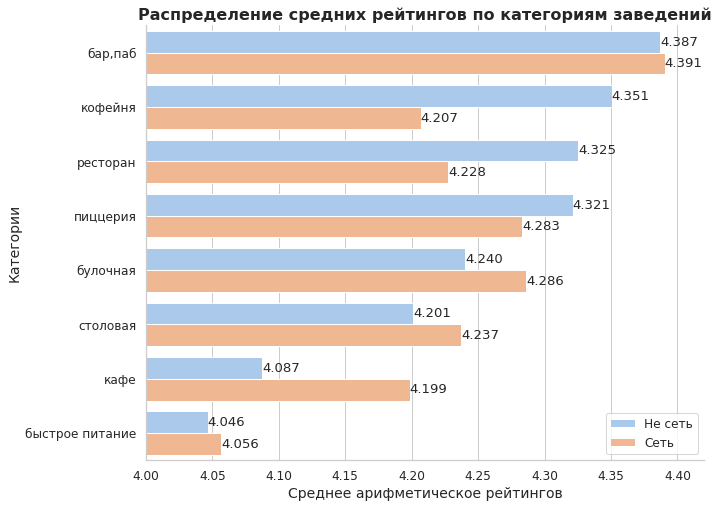

In [42]:
sns.set_palette('pastel')
fig, ax = plt.subplots(figsize=(10, 8))
p = sns.barplot(y='category', x= 'mean' , data=cat_rating, order = cat_sorted1,
            orient='h', hue='chain', legend=True)
ax.set_xlim(4, 4.42)

for container in ax.containers:
    ax.bar_label(container, fmt='%.3f')
    
sns.despine(right=True, top = True)
plt.legend(loc='lower right')
ax.set_xlabel("Среднее арифметическое рейтингов", fontsize=14)
ax.set_ylabel("Категории", fontsize=14)
ax.set_title("Распределение средних рейтингов по категориям заведений",
                 fontsize=16, fontweight = 'bold')

fig.show()

Наиболее высокие рейтинги у баров. Затем у несетевых кофеен, ресторанов и пиццерий.
У быстрого питания самые низкие средние рейтинги, которые меньше, чем у баров на 0.7.

#### Хороплет с рейтингом

Рассчитаем средний рейтинг заведений каждого района.

In [43]:
cat_rating_s = data_to_plot.groupby('district')['rating'].agg('mean').reset_index().sort_values(by='rating', ascending=False)
display(cat_rating_s)

,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.239822
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184417
1,Западный административный округ,4.181647
0,Восточный административный округ,4.174185
7,Юго-Западный административный округ,4.172920
3,Северо-Восточный административный округ,4.147978
6,Юго-Восточный административный округ,4.101120


In [44]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9.3, tiles='Cartodb Positron',
       width=500,height=500)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cat_rating_s,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

In [45]:
print('Перечень административных округов по убыванию рейтинга:',
      cat_rating_s.district.str.replace('административный округ','АО').to_list())

Перечень административных округов по убыванию рейтинга: ['Центральный АО', 'Северный АО', 'Северо-Западный АО', 'Южный АО', 'Западный АО', 'Восточный АО', 'Юго-Западный АО', 'Северо-Восточный АО', 'Юго-Восточный АО']


#### Заведения на карте

In [46]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9.3, tiles='Cartodb Positron',
       width=1000,height=400)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

#### Топ-15 улиц по количеству заведений

In [47]:
top15_str_amnt = data.groupby('street')['name'].agg('count').sort_values(ascending=False).head(15)
print('Топ-15 улиц и количество заведений')
display(top15_str_amnt)
print('Список улиц по убыванию количества заведений:', top15_str_amnt.index.to_list())

Топ-15 улиц и количество заведений


street
проспект Мира             183
Профсоюзная улица         122
проспект Вернадского      108
Ленинский проспект        108
Ленинградский проспект     95
Дмитровское шоссе          88
Каширское шоссе            77
Варшавское шоссе           76
Ленинградское шоссе        70
МКАД                       65
Люблинская улица           60
улица Вавилова             55
Кутузовский проспект       54
улица Миклухо-Маклая       49
Пятницкая улица            48
Name: name, dtype: int64

Список улиц по убыванию количества заведений: ['проспект Мира', 'Профсоюзная улица', 'проспект Вернадского', 'Ленинский проспект', 'Ленинградский проспект', 'Дмитровское шоссе', 'Каширское шоссе', 'Варшавское шоссе', 'Ленинградское шоссе', 'МКАД', 'Люблинская улица', 'улица Вавилова', 'Кутузовский проспект', 'улица Миклухо-Маклая', 'Пятницкая улица']


Немного неожиданно рассматривать МКАД, как улицу. Но формально, МКАД - главная магистральная улица 1-го класса.

In [48]:
top15_str_df = data.query('street in @top15_str_amnt.index') #Датасет только по 15 выбранным улицам
#Группировка по улицам и категориям с количеством заведений
df3 = top15_str_df.groupby(['street', 'category'])['name'].agg('count').reset_index() 
display(df3.head())
#Группировка только по улицам с количеством заведений
df3_1 = top15_str_df.groupby('street')['name'].agg('count').reset_index().sort_values(by='name')
display(df3_1)

,street,category,name
0,Варшавское шоссе,"бар,паб",6
1,Варшавское шоссе,быстрое питание,7
2,Варшавское шоссе,кафе,18
3,Варшавское шоссе,кофейня,14
4,Варшавское шоссе,пиццерия,4


,street,name
10,Пятницкая улица,48
14,улица Миклухо-Маклая,49
3,Кутузовский проспект,54
13,улица Вавилова,55
7,Люблинская улица,60
8,МКАД,65
5,Ленинградское шоссе,70
0,Варшавское шоссе,76
2,Каширское шоссе,77
1,Дмитровское шоссе,88


In [49]:
fig = px.bar(df3, y="street", x="name", color="category",  orientation='h', text_auto=True, width=900, height=600)
#Добавление подписей для улиц целиком
fig.add_trace(go.Scatter(mode='text', orientation='h',
                         y=df3.groupby('street')['name'].agg('sum').index.tolist(),
                         #Определение позиций текста с итоговыми по улице данными 
                         x=df3.groupby('street')['name'].agg('sum').map(lambda x: x+5).tolist(),
                         text=['Всего: '+ str(x) for x in df3.groupby('street')['name'].agg('sum').tolist()],
                         textposition='middle right',
                         textfont=dict(size=14),
                         showlegend=False
                        ))
#Располагаем улицы в отсортированном порядке по количеству заведений
fig.update_yaxes(tickangle=-45, categoryorder= 'array', categoryarray = df3_1.street)
fig.update_xaxes(range=[0, 210])

fig.update_layout(legend=dict(
                    orientation="h",
                    yanchor="top",
                    y=-0.15,
                    xanchor="left",
                    x=0
                    ),
            title=dict(text="<b>Типы категорий заведений по районам Москвы</b>", font=dict(size=16)),
            xaxis_title="Количество заведений",
            yaxis_title="Районы"
                 )


fig.update_layout(legend=dict(orientation="h", title = 'Категории', y=-0.15),
                  title=dict(text="<b>Количество заведений по топ-15 улиц Москвы</b>", font=dict(size=16)),
                  xaxis_title="Количество заведений",
                  yaxis_title="Улицы")


fig.show()

Больше всего заведений на проспекте Мира. Особенно много на ней ресторанов, кофеен и кафе.

#### Улицы с одним объектом

Количеcтво улиц только с одним заведением питания: 453


Index(['name', 'category', 'address', 'district', 'hours', 'lat', 'lng',
       'rating', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup',
       'chain', 'seats', 'street', 'is_24_7'],
      dtype='object')

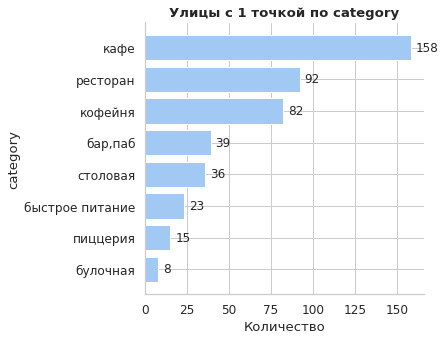

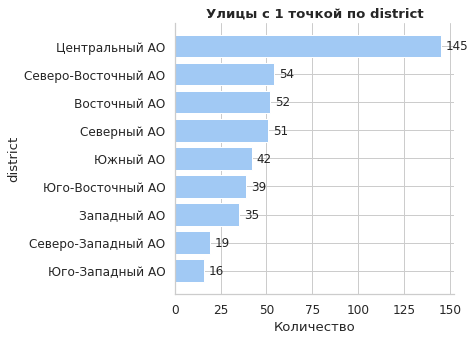

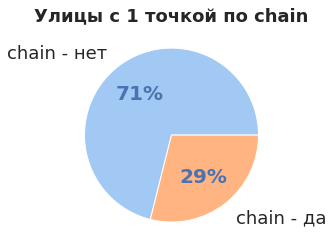

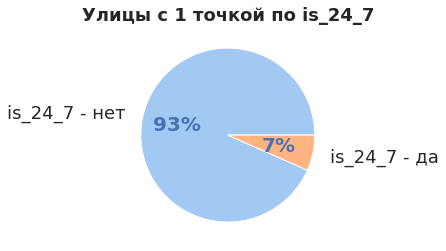

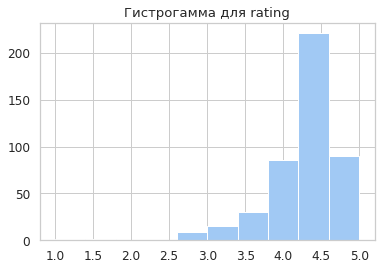

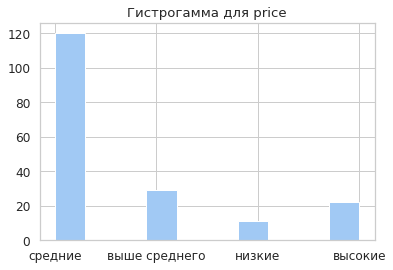

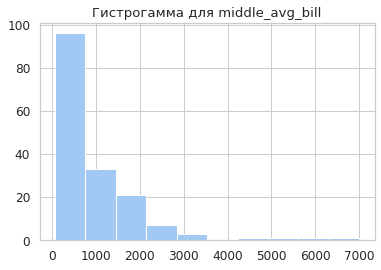

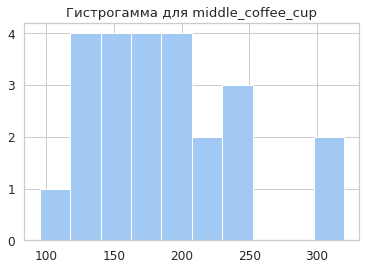

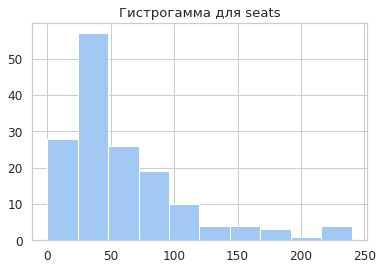

In [50]:
one_obj_str = data.groupby('street')['name'].agg('count').sort_values(ascending=True)\
                .reset_index().query('name==1').street.to_list()
print('Количеcтво улиц только с одним заведением питания:', len(one_obj_str))
one_obj_df = data.query('street in @one_obj_str')
display(one_obj_df.columns)
col_disp1 = ['category', 'district']

col_disp_circ = ['chain', 'is_24_7']

col_disp2 = ['rating', 'price', 'middle_avg_bill', 'middle_coffee_cup', 'seats']

for c in col_disp1:
    df_temp = one_obj_df[c].value_counts().reset_index() 
    f, ax = plt.subplots(figsize=(5, 5))
    hbars = ax.barh(df_temp['index'].str.replace('административный округ','АО'), df_temp[c], label = df_temp[c], align='center')
    ax.invert_yaxis()
    ax.bar_label(hbars, padding=5,  
             fontsize=12, label_type='edge' 
            )
    ax.spines[['right', 'top']].set_visible(False)
    ax.set_xlabel('Количество')
    ax.set_ylabel(c)
    ax.set_title('Улицы с 1 точкой по '+ c, fontweight = 'bold')
    plt.show();


for c in col_disp_circ:
    df_temp = one_obj_df[c].value_counts(normalize=True)*100
    patches, texts, autotexts = plt.pie(df_temp,
    labels = [c+' - нет', c+' - да'], labeldistance=1.2,
    autopct='%.0f%%', textprops={'fontsize': 18})
    plt.title('Улицы с 1 точкой по '+ c, fontsize = 18, fontweight = 'bold')

    for autotext in autotexts:
        autotext.set_color('b')
        autotext.set_fontsize(20)
        autotext.set_fontweight('bold')
    plt.show()
    
for c in col_disp2:
    x=one_obj_df[c].hist()
    plt.title('Гистрогамма для '+ c)
    plt.show();

Не смотря на то, что в ЦАО больше всего заведений, в этом округе самое большое количество улиц всего с одним заведением.
Несетевых заведений, присутствующих в одиночку на какой-то улице, в три раза больше, чем сетевых.
Подавляющее большинство таких заведений не работают ежедневно и круглосуточно.
У большинства из них рейтинг от 4.3 до 4.5.
Цены - средние. Количество посадочных мест - до 100.

Скорей всего, на этих улицах низкая проходимость, или они довольно короткие и рядом уже есть заведения питания.

#### Средние чеки по округам Москвы

Рассчитаем медианные значения средних чеков для каждого округа.

In [51]:
dist_avg_bill = data.groupby('district')['middle_avg_bill'].agg('median').reset_index().sort_values(by='middle_avg_bill', ascending=False)
dist_avg_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [52]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9.3, tiles='Cartodb Positron',
       width=500,height=500)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=dist_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по округам',
).add_to(m)

# выводим карту
m

Самые высокие средние чеки в Центральном и Западном административных округах. В остальных округах цены ниже.

Посчитаем условное угловое расстояние заведений от центра Москвы.

In [53]:
data['center_dist'] = data.apply(
    lambda x: np.linalg.norm( np.array((moscow_lat, moscow_lng))-np.array((x['lat'],x['lng']))),
    axis = 1
    )
data[['name', 'center_dist']].head()

,name,center_dist
0,WoWфли,0.188866
1,Четыре комнаты,0.182908
2,Хазри,0.166064
3,Dormouse Coffee Shop,0.183797
4,Иль Марко,0.213221


Разделим все расстояние от центра на условные 5 зон удаления.

In [54]:
data['center_dist'] = data['center_dist'].apply(lambda x: round(round(x*100)/5))

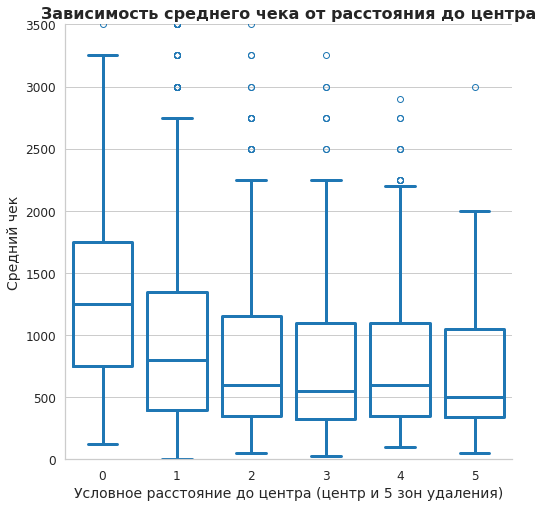

In [55]:
sns.set_palette('tab10')
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_ylim(0, 3500)

sns.boxplot(data=data, x='center_dist', y='middle_avg_bill', fill = False, linewidth=3)
ax.set_xlabel("Условное расстояние до центра (центр и 5 зон удаления)", fontsize=14)
ax.set_ylabel("Средний чек", fontsize=14)
ax.set_title("Зависимость среднего чека от расстояния до центра", fontsize=16, fontweight = 'bold')
sns.despine(top=True)
plt.show()

fig.show()

Видно, что в самом центре и ближайшей к нему зоне цены выше. Далее цены приблизительно одинаковые и начинают снижаться только ближе к МКАД.

#### Общий вывод по анализу данных <a id='analysis_res'></a>

В данных присутствуют следующие типы заведений: 'кафе' 'ресторан' 'кофейня' 'бар,паб' 'пиццерия' 'быстрое питание'
 'столовая' 'булочная'.  
 Наибольшее количество заведений присутствует в категории "кафе" - 2377, наименьшее - в категории "булочная" - 256.
 
 Если учитывать сетевые заведения, то по убыванию медианных значений количества посадочным мест порядок будет такой: 'ресторан', 'кофейня', 'бар,паб', 'столовая', 'быстрое питание', 'кафе', 'пиццерия', 'булочная'.
Для несетевых заведений - 'бар,паб', 'ресторан', 'столовая', 'кофейня', 'пиццерия', 'быстрое питание', 'кафе', 'булочная'.   

Несетевых заведений больше - их 62% от общего числа, а сетевых - 38%.  

Категории по убыванию доли сетевых заведений: 'булочная', 'пиццерия', 'кофейня', 'быстрое питание', 'ресторан', 'кафе', 'столовая', 'бар,паб'. То есть, по доле сетевых заведений лидирует категория "Булочные", затем идут "Пиццерия" и "Кофейня".

Топ-15 сетей: 'Шоколадница', "Домино'с Пицца", 'Додо Пицца', 'One Price Coffee', 'Яндекс Лавка', 'Cofix', 'Prime', 'КОФЕПОРТ', 'Кулинарная лавка братьев Караваевых', 'Теремок', 'CofeFest', 'Чайхана', 'Буханка', 'Drive Café', 'Кофемания'.  
Категории этих заведений по убыванию частотности: кофейня, кафе, ресторан, пиццерия, булочная.  
Больше всего заведений в ЦАО, особенное отличие от других округов по категориям рестоанов, кофеен, кафе и баров.  
Меньше всего заведений в СЗАО.

Наиболее высокие рейтинги у баров. Затем у несетевых кофеен, ресторанов и пиццерий.
У быстрого питания самые низкие средние рейтинги, которые меньше, чем у баров на 0.7.

Перечень административных округов по убыванию рейтинга: 'Центральный АО', 'Северный АО', 'Северо-Западный АО', 'Южный АО', 'Западный АО', 'Восточный АО', 'Юго-Западный АО', 'Северо-Восточный АО', 'Юго-Восточный АО'.

Список улиц по убыванию количества заведений: 'проспект Мира', 'Профсоюзная улица', 'проспект Вернадского', 'Ленинский проспект', 'Ленинградский проспект', 'Дмитровское шоссе', 'Каширское шоссе', 'Варшавское шоссе', 'Ленинградское шоссе', 'МКАД', 'Люблинская улица', 'улица Вавилова', 'Кутузовский проспект', 'улица Миклухо-Маклая', 'Пятницкая улица'.
Больше всего заведений на проспекте Мира. Особенно много на ней ресторанов, кофеен и кафе.


Не смотря на то, что в ЦАО больше всего заведений, в этом округе самое большое количество улиц всего с одним заведением.
Несетевых заведений, присутствующих в одиночку на какой-то улице, в три раза больше, чем сетевых.
Подавляющее большинство таких заведений не работают ежедневно и круглосуточно.
У большинства из них рейтинг от 4.3 до 4.5.
Цены - средние. Количество посадочных мест - до 100.
Количество улиц с одним заведением - 453. Скорей всего, на этих улицах низкая проходимость, или они довольно короткие и рядом уже есть заведения питания.


Самые высокие средние чеки в Центральном и Западном административных округах. В остальных округах цены ниже.

В самом центре и ближайшей к нему зоне цены выше. Далее цены приблизительно одинаковые и начинают снижаться только ближе к МКАД.

### Детализация исследования

#### Сколько всего кофеен

In [56]:
coff_df = data.query('category == "кофейня"')
print('Всего в датасете {} кофеен'.format(len(coff_df)))

Всего в датасете 1413 кофеен


#### В каких районах больше кофеен, каковы особенности расположения

In [57]:
pts_per_distr = coff_df.groupby('district')['name'].agg('count').reset_index().sort_values(by='name' ,ascending=False)
pts_per_distr

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


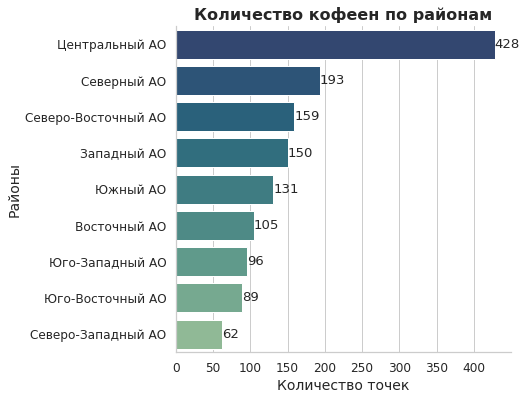

In [58]:
df_temp = pts_per_distr.copy()
df_temp.district = df_temp.district.str.replace('административный округ','АО')

fig, ax = plt.subplots(figsize=(6, 6))
sns.barplot(y='district', x='name', data=df_temp, 
            orient='h', palette='crest_r', hue='district', legend=False)
for container in ax.containers:
    ax.bar_label(container)
    
ax.set_xlabel("Количество точек", fontsize=14)
ax.set_ylabel("Районы", fontsize=14)
ax.set_title("Количество кофеен по районам",
                 fontsize=16, fontweight = 'bold')
sns.despine(top=True, right=True)
fig.show()

Больше всего кофеен в Центральном АО. Значительные количества также в САО, СВАО, ЗАО и ЮАО.

Расположение кофеен показано ниже на карте.

In [59]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9.3, tiles='Cartodb Positron',
       width=1000,height=400)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coff_df.apply(create_clusters, axis=1)

# выводим карту
m

In [60]:
pts_per_distr

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [61]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9.3, tiles='Cartodb Positron',
       width=500,height=500)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=pts_per_distr,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Количество кофеен по округам',
).add_to(m)

# выводим карту
m

In [62]:
print('Перечень округов по убыванию количества кофеен:', pts_per_distr.district.to_list())

Перечень округов по убыванию количества кофеен: ['Центральный административный округ', 'Северный административный округ', 'Северо-Восточный административный округ', 'Западный административный округ', 'Южный административный округ', 'Восточный административный округ', 'Юго-Западный административный округ', 'Юго-Восточный административный округ', 'Северо-Западный административный округ']


#### Круглосуточные кофейни

In [63]:
print('Всего куглосуточных кофеен:', len(coff_df.query('is_24_7 == True')))

Всего куглосуточных кофеен: 59


#### Распределение рейтингов кофеен по районам

In [64]:
caf_rate = coff_df.groupby('district')['rating'].agg(['count','min', 'max','mean', 'median']).reset_index().sort_values(by= 'mean',ascending=False)
display(caf_rate)
print('Округи по убыванию рейтинга кофеен:', caf_rate.district.str.replace('административный округ','АО').to_list())

,district,count,min,max,mean,median
5,Центральный административный округ,428,2.3,5.0,4.336449,4.3
4,Северо-Западный административный округ,62,2.0,5.0,4.325806,4.3
2,Северный административный округ,193,2.0,5.0,4.291710,4.3
7,Юго-Западный административный округ,96,3.3,5.0,4.283333,4.3
0,Восточный административный округ,105,3.0,5.0,4.282857,4.3
8,Южный административный округ,131,2.0,5.0,4.232824,4.3
6,Юго-Восточный административный округ,89,2.3,5.0,4.225843,4.3
3,Северо-Восточный административный округ,159,1.4,5.0,4.216981,4.3
1,Западный административный округ,150,2.3,5.0,4.195333,4.2


Округи по убыванию рейтинга кофеен: ['Центральный АО', 'Северо-Западный АО', 'Северный АО', 'Юго-Западный АО', 'Восточный АО', 'Южный АО', 'Юго-Восточный АО', 'Северо-Восточный АО', 'Западный АО']


In [65]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9.3, tiles='Cartodb Positron',
       width=500,height=500)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=caf_rate,
    columns=['district', 'mean'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

Максимальный средний рейтинг - 4.34 в ЦАО, минимальный - 4,2 в ЗАО. Отличия небольшие.

#### Стоимость чашки капучино

In [66]:
cof_cup = coff_df.groupby('district')['middle_coffee_cup'].agg(['count','min', 'max','mean', 'median'])\
        .reset_index()\
        .sort_values(by= 'mean',ascending=False)
cof_cup

,district,count,min,max,mean,median
1,Западный административный округ,49,60.0,300.0,189.938776,189.0
5,Центральный административный округ,162,60.0,328.0,187.518519,190.0
7,Юго-Западный административный округ,34,95.0,291.0,184.176471,198.0
0,Восточный административный округ,42,60.0,1568.0,174.023810,135.0
2,Северный административный округ,76,60.0,325.0,165.789474,159.0
4,Северо-Западный административный округ,21,60.0,270.0,165.523810,165.0
3,Северо-Восточный административный округ,60,60.0,297.0,165.333333,162.5
8,Южный административный округ,43,60.0,275.0,158.488372,150.0
6,Юго-Восточный административный округ,34,60.0,375.0,151.088235,147.5


In [67]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9.3, tiles='Cartodb Positron',
       width=500,height=500)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cof_cup,
    columns=['district', 'mean'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Стоимость чашки капучино в кофейнях по районам',
).add_to(m)

# выводим карту
m

Максимальная медианная стоимость чашки кофе - 189 р. в ЗАО, минимальная медианная - 147.5 в ЮВАО. Разница около 25%.

#### На какую стоимость чашки капучино стоит ориентироваться

При определении стоимости чашки капучино стоит ориентироваться на среднюю стоимость в конкретном административном округе. По мере повышения рейтинга имеет смысл и повышать стоимость чека.  
Цена является одним из факторов конкурентоспособности, но сравнивать потребитель будет только в условиях ближайшей доступности. 

In [68]:
cof_cup_r = coff_df.groupby('district')[['middle_coffee_cup','rating']].agg('mean')
cof_cup_r

,middle_coffee_cup,rating
district,,
Восточный административный округ,174.023810,4.282857
Западный административный округ,189.938776,4.195333
Северный административный округ,165.789474,4.291710
Северо-Восточный административный округ,165.333333,4.216981
Северо-Западный административный округ,165.523810,4.325806
Центральный административный округ,187.518519,4.336449
Юго-Восточный административный округ,151.088235,4.225843
Юго-Западный административный округ,184.176471,4.283333
Южный административный округ,158.488372,4.232824


#### Открытие нового заведения

Определенить точку открытия можно по следующим критериям:
- хорошая проходимость (там, где уже есть кофейни)
- где конкуренты имеют невысокий рейтинг
- в данном районе уже есть спрос и потенциальная доля доходов от присутствующих конкурентов не позволит уйти в минус.

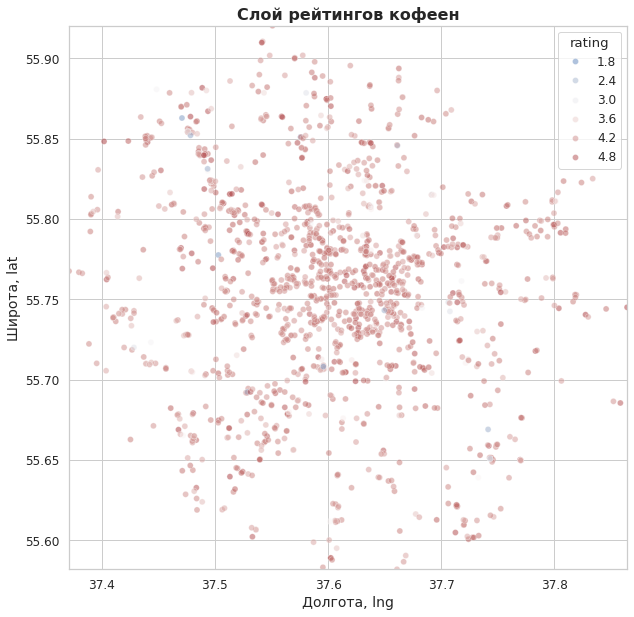

In [69]:
sns.set_palette('vlag')
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_ylim(coff_df.lat.min(), coff_df.lat.max())
ax.set_xlim(coff_df.lng.min(), coff_df.lng.max())
sns.scatterplot(data=coff_df, y='lat', x='lng', palette='vlag', alpha=0.5, hue='rating')

ax.set_ylabel("Широта, lat", fontsize=14)
#    vplot.legend(title = "Принадлежность сети", title_fontsize = 14, fontsize = 12, shadow = True, facecolor = 'white')
ax.set_xlabel("Долгота, lng", fontsize=14)
ax.set_title("Слой рейтингов кофеен",
                 fontsize=16, fontweight = 'bold')

plt.show()

На графике выше можно визуально оценить концентрацию точек с невысоким рейтингом. Концентрация косвенно свидетельствует о хорошей проходимости, а невысокий рейтинг говорит о возможности конкурировать.

Если исходить из имеющимися данными, можно определить улицы с количеством точек выше определенного минимума (например, выше 5, хотя это число должно быть пропорционально длине улицы) и со средним по улице рейтингом ниже определенного уровня (например, 4.5).  
Составим список таких улиц и обозначим на карте эти заведения. Потенциально, размещать новые точки можно недалеко от обозначенных на карте.

In [70]:
perspect_str_df = coff_df.groupby('street')['rating'].agg(['median','count'])\
        .sort_values(by='count', ascending = False)\
        .query('count > 5 and median < 4.5')
perspect_str_df

,median,count
street,,
проспект Мира,4.20,36
Ленинградский проспект,4.30,25
Ленинский проспект,4.40,24
Профсоюзная улица,4.30,18
проспект Вернадского,4.20,16
Каширское шоссе,4.25,16
Варшавское шоссе,4.25,14
Кутузовский проспект,4.30,13
Новослободская улица,4.30,13


In [71]:
persp_str_pts = data.query('street in @perspect_str_df.index')

In [72]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9.3, tiles='Cartodb Positron',
       width=1000,height=400)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
persp_str_pts.apply(create_clusters, axis=1)

# выводим карту
m

#### Вывод детализации по кофейням <a id='cof_det'></a>

1. Всего в датасете 1413 кофеен  
2. Больше всего кофеен в Центральном АО. Значительные количества также в САО, СВАО, ЗАО и ЮАО.  
3. Всего куглосуточных кофеен: 59.  
4. Округи по убыванию рейтинга кофеен: 'Центральный АО'(4.34), 'Северо-Западный АО', 'Северный АО', 'Юго-Западный АО', 'Восточный АО', 'Южный АО', 'Юго-Восточный АО', 'Северо-Восточный АО', 'Западный АО'(4.2).<br>Максимальная медианная стоимость чашки кофе - 189 р. в ЗАО, минимальная медианная - 147.5 в ЮВАО. Разница около 25%.
5. При определении стоимости чашки капучино стоит ориентироваться на среднюю стоимость в конкретном административном округе. По мере повышения рейтинга имеет смысл и повышать стоимость чека.<br>Цена является одним из факторов конкурентоспособности, но сравнивать потребитель будет только в условиях ближайшей доступности.
6. Для открытия новой точки наиболее перспективные округи: Западный и Северо-Восточный.<br>В них невысокий средний рейтинг заведений и не самое малое количество точек.<br>В Западном еще и высокий средний чек, а в Северо-Восточном одно из высоких количество улиц всего с одним заведением питания.


## Выводы

1. В результате проведенной работы выполнена предварительная обработка данных.
2. Проведен анализ данных. Выводы по анализу представлены в п. 2.3.13 [Общий вывод по анализу данных](#analysis_res)
3. Проведен более детальный анализ данным по кофейням. Выводы по анализу представлены в п. 2.4.8 [Вывод детализации по кофейням](#cof_det)
3. Подготовлена презентация.